# _Diamond Price Analysis Using Python ANN_

<img src='../data/dataset-cover.jpg'>

_Bu veri seti, elmasların fiyatlarını tahmin etmek için kullanılacak. İçerisinde elmasın fiziksel ve kalite özellikleri yer alır._

| Sütun     | Açıklama |
|----------|----------|
| carat    | Elmasın ağırlığı (1 carat ≈ 0.2 gram) |
| cut      | Elmasın kesim kalitesi (`Fair`, `Good`, `Very Good`, `Premium`, `Ideal`) |
| color    | Elmasın rengi (`D` en iyi, `J` en düşük) |
| clarity  | Elmasın berraklığı (`IF`, `VVS1`, `VVS2`, `VS1`, `VS2`, `SI1`, `SI2`, `I1`) |
| depth    | Elmasın derinlik yüzdesi (top-to-bottom ölçüm) |
| table    | Elmasın üst yüzey oranı (en geniş kısmının yüzeye oranı) |
| price    | Elmasın fiyatı (USD) |
| x        | Uzunluk (mm) |
| y        | Genişlik (mm) |
| z        | Yükseklik (mm) |

## _Import_

In [1]:
import pandas as pd
pd.set_option('display.max_columns', 55)  
# Pandas DataFrame çıktılarında tüm sütunların görünmesini sağlar.

import warnings
warnings.filterwarnings('ignore')  
# Uyarıları gizler, böylece kod çalışırken kullanıcıyı rahatsız etmez.

from sklearn.linear_model import LinearRegression, Ridge, Lasso
# LinearRegression: Doğrusal regresyon modelini kullanır.
# Ridge: L2 regularizasyonu ile doğrusal regresyon.
# Lasso: L1 regularizasyonu ile doğrusal regresyon.

from sklearn.model_selection import train_test_split
# Veriyi eğitim ve test setlerine ayırır.

from sklearn.metrics import r2_score, mean_squared_error
# r2_score: Modelin açıklama gücünü ölçer.
# mean_squared_error: Modelin hata oranını ölçer, kareler ortalaması hatası.

import numpy as np  # NumPy, matematiksel ve matris işlemleri için kullanılır.

import matplotlib.pyplot as plt 
# Veriyi görselleştirmek için grafikler çizen kütüphane.

import seaborn as sns 
# Veri görselleştirme kütüphanesi, genellikle daha estetik ve kompleks grafikler oluşturur.

In [2]:
import plotly.express as px

## _Read Data_

In [3]:
df = pd.read_csv('../data/diamonds.csv')  
# 'Real_Estate.csv' dosyasını okur ve DataFrame (df) olarak yükler.

## _Exploratory Data Analysis_

In [4]:
df.head()  
# DataFrame'in ilk 5 satırını gösterir. Veri yapısının hızlıca gözlemlenmesi için kullanılır.

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [5]:
df.tail()  
# DataFrame'in son 5 satırını gösterir. Verinin son kısmına bakmak için kullanılır.

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
53935,53936,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53936,53937,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53937,53938,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53938,53939,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74
53939,53940,0.75,Ideal,D,SI2,62.2,55.0,2757,5.83,5.87,3.64


In [6]:
df.describe()  
# Sayısal sütunlar için temel istatistiksel bilgileri (ortalama, standart sapma, min, max vs.) döker.

,Unnamed: 0,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,26970.500000,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,15571.281097,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,1.000000,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,13485.750000,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,26970.500000,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,40455.250000,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,53940.000000,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [7]:
df.info()  
# DataFrame hakkında genel bilgi verir (sütun isimleri, veri tipi, boş değer sayısı vb.).

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  53940 non-null  int64  
 1   carat       53940 non-null  float64
 2   cut         53940 non-null  object 
 3   color       53940 non-null  object 
 4   clarity     53940 non-null  object 
 5   depth       53940 non-null  float64
 6   table       53940 non-null  float64
 7   price       53940 non-null  int64  
 8   x           53940 non-null  float64
 9   y           53940 non-null  float64
 10  z           53940 non-null  float64
dtypes: float64(6), int64(2), object(3)
memory usage: 4.5+ MB


In [8]:
df.isnull().sum()  
# Hangi sütunlarda kaç tane eksik (null) değer olduğunu sayar.

Unnamed: 0    0
carat         0
cut           0
color         0
clarity       0
depth         0
table         0
price         0
x             0
y             0
z             0
dtype: int64

In [9]:
df.corr(numeric_only=True)  
# Sayısal sütunlar arasındaki korelasyonları hesaplar. Veriler arasındaki ilişkiyi görmek için kullanılır.

,Unnamed: 0,carat,depth,table,price,x,y,z
Unnamed: 0,1.000000,-0.377983,-0.034800,-0.100830,-0.306873,-0.405440,-0.395843,-0.399208
carat,-0.377983,1.000000,0.028224,0.181618,0.921591,0.975094,0.951722,0.953387
depth,-0.034800,0.028224,1.000000,-0.295779,-0.010647,-0.025289,-0.029341,0.094924
table,-0.100830,0.181618,-0.295779,1.000000,0.127134,0.195344,0.183760,0.150929
price,-0.306873,0.921591,-0.010647,0.127134,1.000000,0.884435,0.865421,0.861249
x,-0.405440,0.975094,-0.025289,0.195344,0.884435,1.000000,0.974701,0.970772
y,-0.395843,0.951722,-0.029341,0.183760,0.865421,0.974701,1.000000,0.952006
z,-0.399208,0.953387,0.094924,0.150929,0.861249,0.970772,0.952006,1.000000


In [10]:
df.shape  
# DataFrame'in boyutlarını (satır sayısı, sütun sayısı) döker.

(53940, 11)

## _Veri Görselleştirme / Outlier_

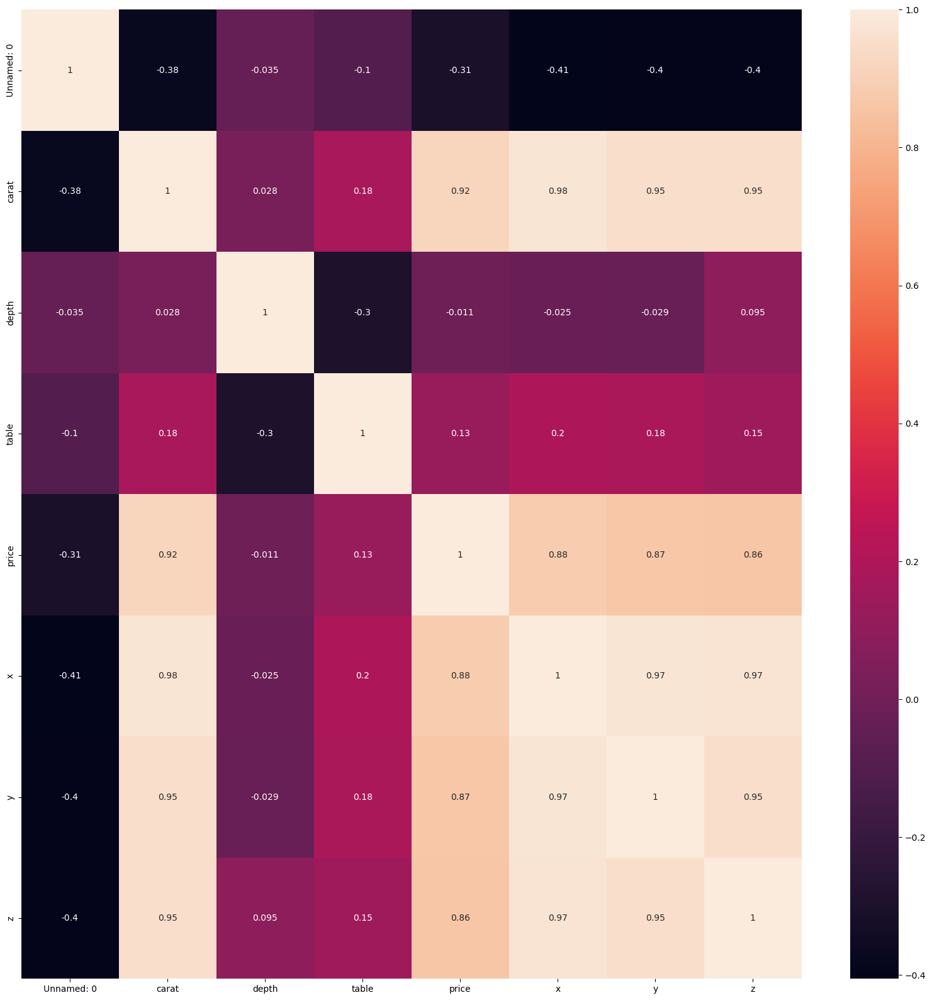

In [11]:
plt.figure(figsize=(20, 20))  

# Grafik boyutlarını ayarlamak için kullanılır. Burada 20x20 inçlik bir boyut belirlenmiş.

sns.heatmap(df.corr(numeric_only=True), annot=True); 
 
# Veri setindeki sayısal sütunlar arasındaki korelasyon matrisini ısı haritası olarak görselleştirir.
# annot=True parametresi, her hücreye korelasyon değerini yazdırır.

In [12]:
abs(df.corr(numeric_only=True)['price'].sort_values(ascending=False))  

# 'price' sütunu ile diğer sayısal sütunlar arasındaki korelasyonları alır.
# abs() fonksiyonu, negatif korelasyonları pozitif hale getirir (mutlak değeri alır).
# sort_values(ascending=False) ise korelasyonları büyükten küçüğe doğru sıralar. True yazsaydık küçükten büyüğe sıralardı.
# Bu, 'price' sütunu ile en yüksek korelasyona sahip olan diğer sütunları görmeyi sağlar.

price         1.000000
carat         0.921591
x             0.884435
y             0.865421
z             0.861249
table         0.127134
depth         0.010647
Unnamed: 0    0.306873
Name: price, dtype: float64

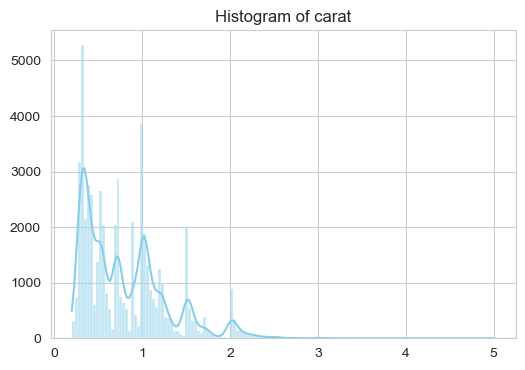

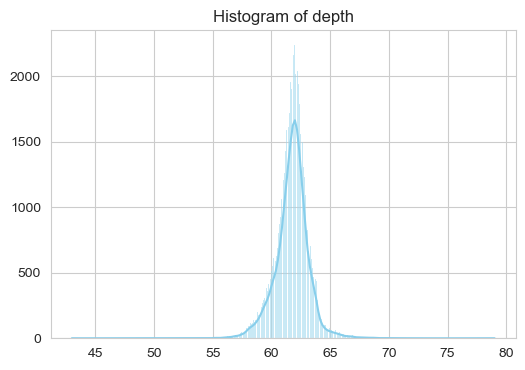

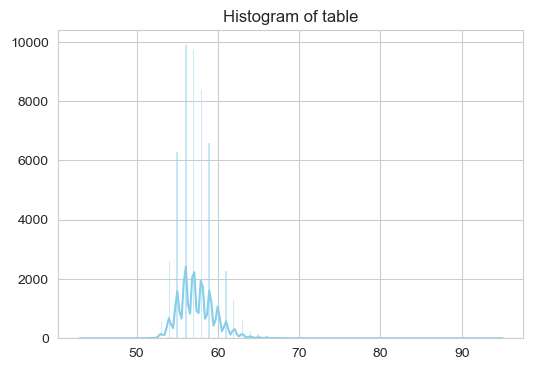

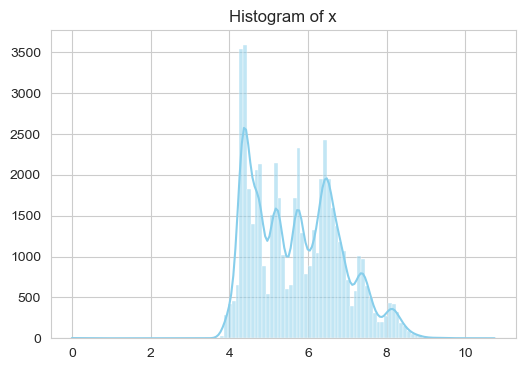

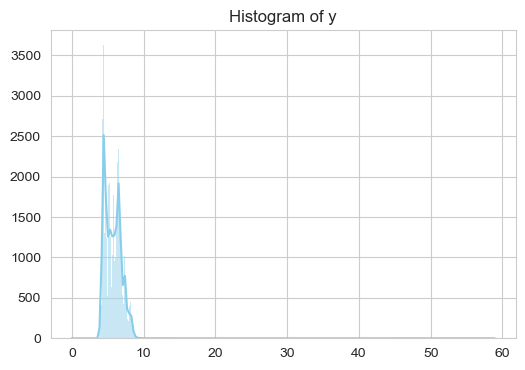

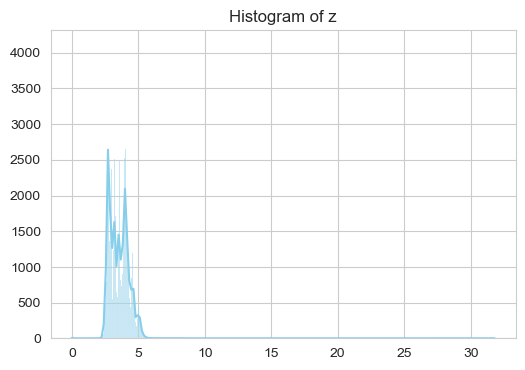

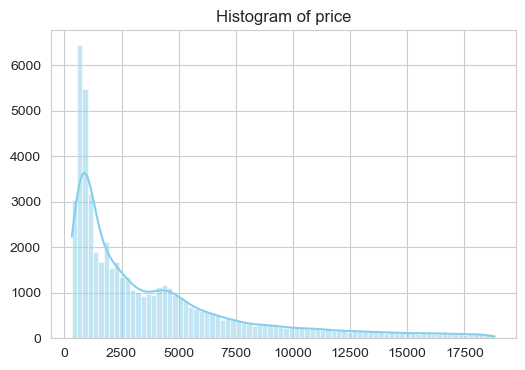

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

# Sayısal sütunlar
numeric_cols = ['carat', 'depth', 'table', 'x', 'y', 'z', 'price']

# Her sütun için histogram oluştur
for col in numeric_cols:
    plt.figure(figsize=(6,4))
    sns.histplot(df[col], kde=True, color='skyblue')
    plt.title(f'Histogram of {col}')
    plt.xlabel('')
    plt.ylabel('')
    plt.show()

In [16]:
df["size"] = df["x"] * df["y"] * df["z"]

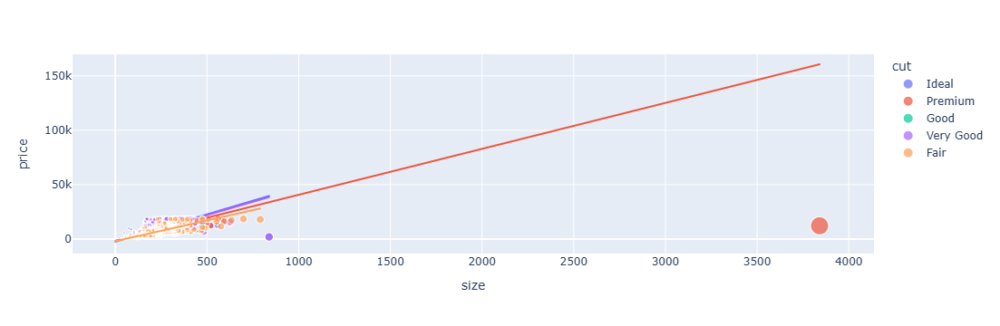

In [17]:
figure = px.scatter(data_frame = df, x="size",
                    y="price", size="size", 
                    color= "cut", trendline="ols")
figure.show()

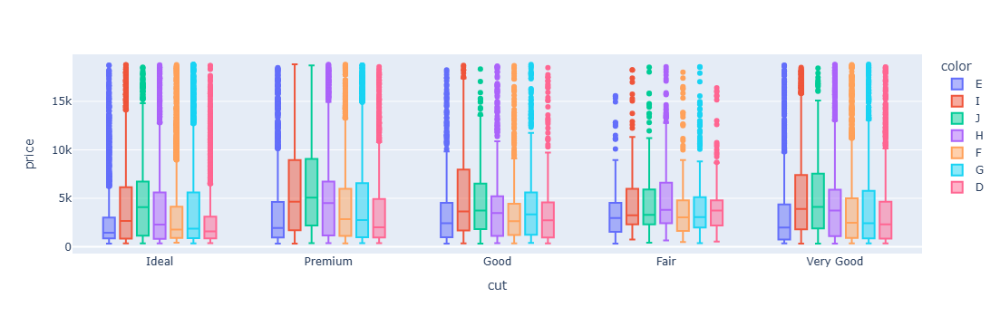

In [18]:
fig = px.box(df, x="cut", 
             y="price", 
             color="color")
fig.show()

## _Features Engineering_

In [19]:
df = df.drop('Unnamed: 0', axis=1)

In [20]:
print(df.dtypes)

carat      float64
cut         object
color       object
clarity     object
depth      float64
table      float64
price        int64
x          float64
y          float64
z          float64
size       float64
dtype: object


In [21]:
df = pd.get_dummies(df, columns=['cut', 'color', 'clarity'], drop_first=True)

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   carat          53940 non-null  float64
 1   depth          53940 non-null  float64
 2   table          53940 non-null  float64
 3   price          53940 non-null  int64  
 4   x              53940 non-null  float64
 5   y              53940 non-null  float64
 6   z              53940 non-null  float64
 7   size           53940 non-null  float64
 8   cut_Good       53940 non-null  bool   
 9   cut_Ideal      53940 non-null  bool   
 10  cut_Premium    53940 non-null  bool   
 11  cut_Very Good  53940 non-null  bool   
 12  color_E        53940 non-null  bool   
 13  color_F        53940 non-null  bool   
 14  color_G        53940 non-null  bool   
 15  color_H        53940 non-null  bool   
 16  color_I        53940 non-null  bool   
 17  color_J        53940 non-null  bool   
 18  clarit

In [23]:
# Sayısal sütunlar
num_cols = ['carat', 'depth', 'table', 'x', 'y', 'z', 'price']

# 97. yüzdelik değerleri hesapla
upper_limits = df[num_cols].quantile(0.97)

In [24]:
# Tek satırda tüm sütunlar için aykırı değerleri temizle
df = df[(df[num_cols] <= upper_limits).all(axis=1)]

## _Modelling_

### _X, Y_

In [25]:
x = df.drop(['price'], axis=1)  
# Modelde kullanılmayacak sütunları veri setinden çıkarır.  
# 'axis=1' sütun silmek için kullanılır (axis=0 satır siler).

y = df[['price']]  
# Hedef değişken (bağımlı değişken) olarak 'price' sütununu belirler.

### _Verilerin Standardize Edilmesi (StandardScaler)_

In [26]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
# StandardScaler nesnesi oluşturulur (ortalama=0, std=1 olacak şekilde ölçeklendirme yapar)

x = scaler.fit_transform(x)
# X verisi önce "fit" edilip (ortalama ve std hesaplanır)
# ardından "transform" edilip ölçeklendirilir
# Modelin daha hızlı ve stabil öğrenmesini sağlar

### _Train Test Split_

In [27]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)  
# Veriyi eğitim (%80) ve test (%20) olarak ikiye ayırır.  
# random_state=42 sabit tutulursa her çalıştırmada aynı sonuç elde edilir.

### _Machine Learning_

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")  # Uyarı mesajlarını gizler.
pd.set_option("display.max_columns",100)  # Tüm sütunların görünmesini sağlar.

# Gerekli model kütüphaneleri
from sklearn.linear_model import LinearRegression, SGDRegressor, Ridge, Lasso, ElasticNet
from sklearn.neighbors import KNeighborsRegressor, RadiusNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor, plot_tree, ExtraTreeRegressor
from xgboost import XGBRegressor  # XGBoost modeli
from sklearn.svm import SVR  # Destek vektör regresyonu
from sklearn.neural_network import MLPRegressor  # Yapay sinir ağı tabanlı regresyon

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

from sklearn.preprocessing import StandardScaler, MinMaxScaler  # Veri ölçekleme araçları

def algo_test(x, y):
    # Modelleri tanımlama (hızlı modeller)
    L = LinearRegression()
    R = Ridge()
    Lass = Lasso()
    E = ElasticNet()
    sgd = SGDRegressor()
    ETR = ExtraTreeRegressor()
    GBR = GradientBoostingRegressor()
    kn = KNeighborsRegressor()
    ada = AdaBoostRegressor()
    dt = DecisionTreeRegressor()
    xgb = XGBRegressor()
    
    # Model listesi ve isimleri
    algos = [L, R, Lass, E, sgd, ETR, GBR, ada, kn, dt, xgb]
    algo_names = [
        'Linear', 'Ridge', 'Lasso', 'ElasticNet', 'SGD', 'Extra Tree',
        'Gradient Boosting', 'KNeighborsRegressor', 'AdaBoost',
        'Decision Tree', 'XGBRegressor'
    ]
    
    # Veriyi 0-1 aralığına ölçekleme (Min-Max Normalization)
    x = MinMaxScaler().fit_transform(x)
    
    # Veriyi eğitim (%80) ve test (%20) olarak ayırma
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)
    
    # Performans metriklerini depolamak için listeler
    r_squared = []
    rmse = []
    mae = []
    
    # Sonuç tablosu oluşturma
    result = pd.DataFrame(columns=['R_Squared', 'RMSE', 'MAE'], index=algo_names)
    
    # Tüm modelleri sırayla eğitip test etme
    for algo in algos:
        p = algo.fit(x_train, y_train).predict(x_test)
        r_squared.append(r2_score(y_test, p))  # Modelin açıklama gücü
        rmse.append(mean_squared_error(y_test, p) ** 0.5)  # Hata (Root Mean Squared Error)
        mae.append(mean_absolute_error(y_test, p))  # Ortalama mutlak hata
    
    # Sonuç tablosunu doldurma
    result.R_Squared = r_squared
    result.RMSE = rmse
    result.MAE = mae
    
    # R² değerine göre en başarılı modelden en zayıfa doğru sıralama
    rtable = result.sort_values('R_Squared', ascending=False)
    return rtable

In [29]:
algo_test(x,y)

,R_Squared,RMSE,MAE
XGBRegressor,0.980140,440.918696,239.807480
AdaBoost,0.971540,527.816315,284.496235
Decision Tree,0.967179,566.814140,291.610906
Extra Tree,0.965757,578.959228,294.039339
Gradient Boosting,0.955594,659.299069,347.350864
Linear,0.922627,870.279843,589.237308
Ridge,0.922478,871.115471,590.553488
SGD,0.921926,874.214409,600.551847
Lasso,0.921622,875.911944,596.204574
KNeighborsRegressor,0.867413,1139.239989,826.812539


### _Deep Learning_

#### _Import_

In [30]:
from tensorflow.keras.models import Sequential
# Sequential: katmanları sırayla ekleyerek model kurmamızı sağlar

from tensorflow.keras.layers import Dense
# Dense: tam bağlantılı (fully connected) yapay sinir ağı katmanı

from sklearn.preprocessing import StandardScaler
# Verileri ölçeklemek (standartlaştırmak) için kullanılan sınıf

from tensorflow.keras.callbacks import EarlyStopping
# EarlyStopping: Eğitim sırasında belirli bir metrik iyileşmeyi durdurduğunda
# modeli otomatik olarak durduran callback yapısıdır.
# Overfitting'i engellemek ve gereksiz yere uzun eğitim süresini azaltmak için kullanılır.

#### _Neural Network Modeli_

In [31]:
model = Sequential()
# Boş bir yapay sinir ağı modeli oluşturulur

model.add(Dense(64, activation='relu'))
# İlk gizli katman: 64 nöron, ReLU aktivasyonu

model.add(Dense(128, activation='relu'))
# İkinci gizli katman: 128 nöron, öğrenme kapasitesini artırır

model.add(Dense(256, activation='relu'))
# Üçüncü gizli katman: 256 nöron, modelin en geniş katmanı

model.add(Dense(128, activation='relu'))
# Dördüncü gizli katman: 128 nöron, daralmaya başlıyor

model.add(Dense(64, activation='relu'))
# Beşinci gizli katman: 64 nöron

model.add(Dense(32, activation='relu'))
# Altıncı gizli katman: 32 nöron

model.add(Dense(1))
# Çıkış katmanı: 1 nöron (regresyon problemi olduğu için aktivasyon kullanılmaz)

model.compile(loss='mean_squared_error', optimizer='adam')
# loss = MSE → regresyon için uygun hata fonksiyonu
# optimizer = adam → ağırlıkları güncellemek için kullanılan optimizasyon algoritması

In [32]:
early_stop = EarlyStopping(
    monitor='val_loss',  # İzlenen metrik: doğrulama kaybı (validation loss)
    patience=10          # 10 epoch boyunca iyileşme olmazsa eğitim durur
)
# EarlyStopping overfitting'i önler ve gereksiz uzun eğitim süresini kısaltır

In [33]:
history = model.fit(
    x_train, y_train,
    validation_data=(x_test, y_test),  # Test verisi doğrulama için kullanılıyor
    epochs=130,                        # Maksimum eğitim sayısı
    batch_size=32,                     # Her adımda 32 örnek işlenir
    callbacks=[early_stop],            # EarlyStopping aktif: val_loss iyileşmezse durdurur
    verbose=1                          # Eğitim bilgilerini ekrana yazdırır
)
# EarlyStopping sayesinde model gereksiz yere uzun süre eğitilmez
# En iyi validation loss değerinin olduğu epoch’ta eğitim sonlanır

Epoch 1/130
1222/1222 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 1235041.5000 - val_loss: 279422.2500
Epoch 2/130
1222/1222 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 257139.1719 - val_loss: 282199.7500
Epoch 3/130
1222/1222 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 230689.7812 - val_loss: 213096.1719
Epoch 4/130
1222/1222 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 222869.8594 - val_loss: 231249.6875
Epoch 5/130
1222/1222 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 215339.6875 - val_loss: 203482.1562
Epoch 6/130
1222/1222 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 209265.6875 - val_loss: 249014.6406
Epoch 7/130
1222/1222 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 204067.6406 - val_loss: 207486.7500
Epoch 8/130
1222/1222 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 200992.5781 - val_loss: 194694.9531
Epoch 9/130
1222/1222 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 198987.2188 - val_loss: 193475.2812
Epoch 10/130
1222/1222 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 197339.9062 - val_loss: 226537.8125
Epoch 11

In [34]:
tahmin = model.predict(x_test)
# Eğitilen modelin test verisi üzerindeki tahminlerini üretir
# Regresyon olduğu için çıktılar ev fiyatı tahminleridir (sürekli sayısal değerler)

306/306 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step


In [35]:
r2_score(y_test, tahmin)
# R² skoru: modelin gerçek fiyatları ne kadar iyi açıkladığını gösterir
# 1'e ne kadar yakınsa model o kadar başarılıdır

0.9813764095306396

In [36]:
mean_squared_error(y_test, tahmin)**0.5
# RMSE (Root Mean Squared Error): Hata miktarının kök ortalama kare değeri
# Hata ne kadar düşükse model o kadar iyidir

426.96825482112837

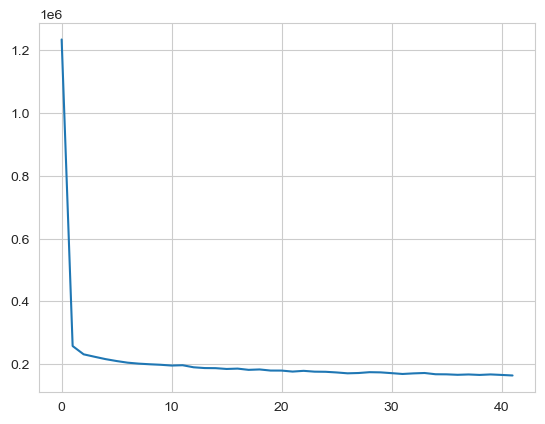

In [37]:
plt.plot(history.history['loss']);
# Eğitim sürecindeki 'loss' (MSE) değerlerinin epoch'lara göre değişimini çizer
# Eğri aşağı doğru gidiyorsa modelin öğrenmeye devam ettiği anlamına gelir

In [38]:
model.save("dl_model.keras")

## _Summary_

_Çalışmada elde edilen tahmin sonuçlarına göre XGBRegressor modeli en iyi performansı göstermiştir. Genel olarak, ensemble ve ağaç tabanlı modeller lineer modellere kıyasla daha başarılı olmuştur. Ayrıca, aykırı değerlerin temizlenmesi ve verilerin ölçeklenmesi model performansını önemli ölçüde artırmıştır. Derin öğrenme modeli de yüksek doğruluk sağlamış olup, ileride kullanılabilecek alternatif bir yöntem olarak değerlendirilebilir._